# Comm B301 - Signals and System Theory Project

## 1. Setup
### 1.1 Importing the necessary libraries.

In [863]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.io import wavfile
from math import ceil
from IPython.display import Audio, display

### 1.2 Loading the recordings files.

We can now upload the reecord files. Let's inspect the sampling rate, as it will come in handy later! And also out of curiosity, let's see the length of a signal. 

In [864]:
sample_rate, mero_recording = wavfile.read('Recordings/mero.wav')
_, hamza_recording = wavfile.read('Recordings/Hamza.wav')
_, abyad_recording = wavfile.read('Recordings/Abyad.wav')
print(sample_rate)
print (mero_recording.shape)

48000
(256956,)


Dividing the signal size by the sample rate should return back the time length of the signal, and indeed $$
    \frac{256956}{48000} \approx 5.3 \text{sec} = \text{Recording length}
    $$

## 2. Plotting the original signals
Let's plot the signal on versus time, to get a better understanding of it, remember that we already figured out how to calculate the duration of the signal, let's use that on the x-axis.

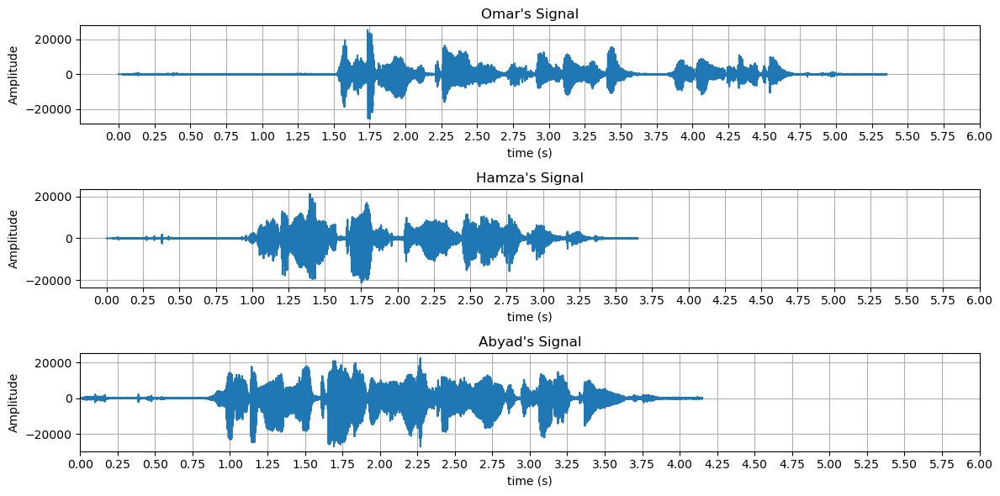

In [865]:
#Calculating time for each signal, with equally spaced time points, ending at the time duration, and the same size as our recordings
time_mero = np.linspace(0, len(mero_recording)/sample_rate, num = len(mero_recording))
time_hamza = np.linspace(0, len(hamza_recording)/sample_rate, num = len(hamza_recording))
time_abyad = np.linspace(0, len(abyad_recording)/sample_rate, num = len(abyad_recording))

#Plotting the three raw signals
plt.figure(figsize=(12, 6))

plt.subplot(3,1,1)
plt.plot(time_mero, mero_recording)
plt.title("Omar's Signal")
plt.xlabel("time (s)")
plt.ylabel("Amplitude")
plt.grid(visible=True)
plt.xticks(np.arange(0, 6.25, 0.25))

plt.subplot(3,1,2)
plt.plot(time_hamza, hamza_recording)
plt.title("Hamza's Signal")
plt.xlabel("time (s)")
plt.ylabel("Amplitude")
plt.grid(visible=True)
plt.xticks(np.arange(0, 6.25, 0.25))

plt.subplot(3,1,3)
plt.plot(time_abyad, abyad_recording)
plt.title("Abyad's Signal")
plt.xlabel("time (s)")
plt.ylabel("Amplitude")  
plt.xlim(0,5.5)
plt.grid(visible=True)
plt.xticks(np.arange(0, 6.25, 0.25))

plt.tight_layout()
plt.show()

## 3. Shifting and Scaling
We will scale and shift our signals.

So, let's build a function that can scale and shift a given signal by $a,t_0$ respectively.

### 3.1 Building a function
We will define a function to perform the required operation

In [866]:
def scale_and_shift(signal, a, t0, sample_rate):
    n = len(signal)
    t = np.arange(n) / sample_rate
    y_t = np.interp(t, (t + t0) / a, signal)
    return y_t

### 3.2 Applying the function on our recordings.
Now we will use the function we defined to shift our recordings, but first, let's plot the functions we're dealing with.

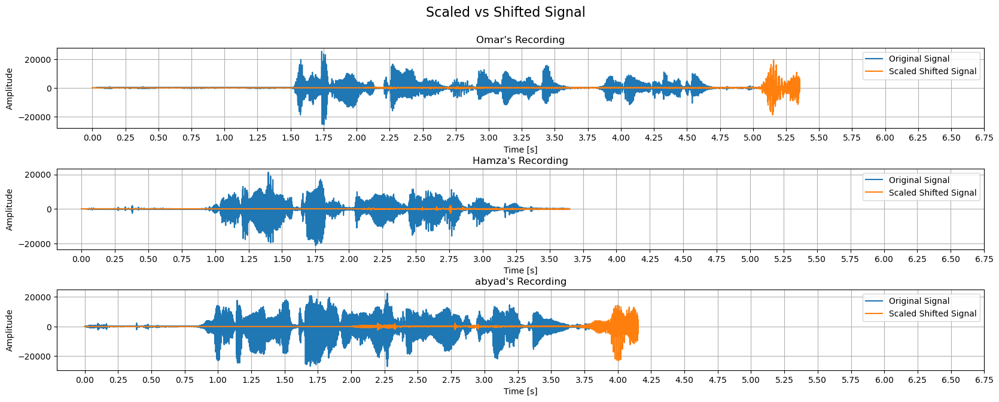

In [867]:
a = 0.5  # Scaling factor
t0 = 1  # Time shift in seconds

# Apply scaling and shifting

edited_mero = scale_and_shift(mero_recording, a, t0, sample_rate)

# Plot the result
plt.figure(figsize=(20, 7   ))
plt.suptitle('Scaled vs Shifted Signal', fontsize = 16)
plt.subplots_adjust(hspace = 0.5)

#let's edit all signals
edited_hamza = scale_and_shift(hamza_recording, a, t0, sample_rate)
edited_abyad = scale_and_shift(abyad_recording, a, t0, sample_rate)

#Let's find the maximum time of all signals to unify the x-axis length
max_time = ceil((max(len(mero_recording), len(hamza_recording), len(abyad_recording), len(edited_mero), len(edited_mero), len(edited_hamza), len(edited_abyad) ) / sample_rate)) +1
tick_spacing = 0.25



plt.subplot(3,1,1)
plt.plot(time_mero, mero_recording, label = 'Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.plot(time_mero, edited_mero, label = 'Scaled Shifted Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.xticks(np.arange(0, max_time, tick_spacing))
plt.grid(visible = True)
plt.title('Omar\'s Recording')
plt.legend(loc = 'upper right')



#Hamza's Signal
plt.subplot(3,1,2)

plt.plot(time_hamza, hamza_recording, label = 'Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.plot(time_hamza, edited_hamza, label = 'Scaled Shifted Signal')

plt.xticks(np.arange(0, max_time, tick_spacing))
plt.grid(visible = True)
plt.title('Hamza\'s Recording')
plt.legend()




#Abyad's Signal
plt.subplot(3,1,3)

plt.plot(time_abyad, abyad_recording, label = 'Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.plot(time_abyad, edited_abyad, label = 'Scaled Shifted Signal')

plt.xticks(np.arange(0, max_time, tick_spacing))
plt.grid(visible = True)
plt.title('abyad\'s Recording')
plt.legend()
plt.show()

### 3.3 Playing the shifted signals, added together
First let's add the original signals to the shifted/scaled signals.
To do so, we'll create a new functoin that extends two signals to be of the same length and returns thee extended signals along side the newly constructed time axis

In [868]:
def extend_signals(signal1, signal2, sample_rate):
	# find the length of the longer signal
	len1 = len(signal1)
	len2 = len(signal2)
	max_len = max(len1, len2)

	# create 2 new signals with the length of the longer signal
	new_signal1 = np.zeros(max_len)
	new_signal2 = np.zeros(max_len)

	# fill the new signals with the old signals
	new_signal1[:len1] = signal1
	new_signal2[:len2] = signal2

	new_time = np.arange(0, max_len/sample_rate, 1/sample_rate)

	return new_time, new_signal1, new_signal2

Now let's add the edit with original signals.



In [869]:
combined_time_mero, extended_mero_recording, extended_edited_mero = extend_signals(mero_recording, edited_mero, sample_rate)
combined_time_hamza, extended_hamza_recording, extended_edited_hamza = extend_signals(hamza_recording, edited_hamza, sample_rate)
combined_time_abyad, extended_abyad_recording, extended_edited_abyad = extend_signals(abyad_recording, edited_abyad, sample_rate)

#examine if the signals have the same length
print(len(extended_mero_recording),' ', len(extended_edited_mero))

256956   256956


As you can see, they indeed have the same length, now let's combine each two signals together

In [870]:
#Combine the original and the scaled and shifted signals
combined_mero = extended_mero_recording + extended_edited_mero
combined_hamza = extended_hamza_recording + extended_edited_hamza
combined_abyad = extended_abyad_recording + extended_edited_abyad

Now let's work with each signal alone.

#### 3.3.1 Manipulating Omar's Signal

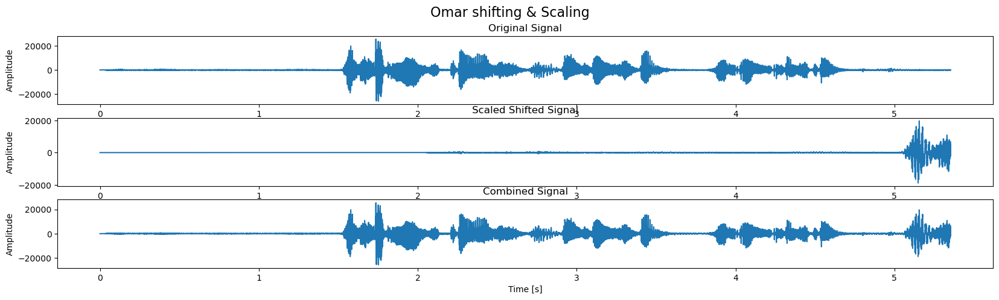

In [871]:
#Let's plot the signals

plt.figure(figsize=(20, 5))
plt.suptitle('Omar shifting & Scaling', fontsize = 16)

plt.subplot(3,1,1)
plt.plot(combined_time_mero, extended_mero_recording, label = 'Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.title('Original Signal')

plt.subplot(3,1,2)
plt.plot(combined_time_mero, extended_edited_mero, label = 'Scaled Shifted Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.title('Scaled Shifted Signal')

plt.subplot(3,1,3)
plt.plot(combined_time_mero, combined_mero, label = 'Combined Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.title('Combined Signal')

plt.show()

Now let's play the combined signal and the original signal.


In [872]:
display(Audio(extended_mero_recording, rate=sample_rate))
display(Audio(edited_mero, rate=sample_rate))
display(Audio(combined_mero, rate=sample_rate))

#### 3.3.2 Manipulating Hamza's Signal

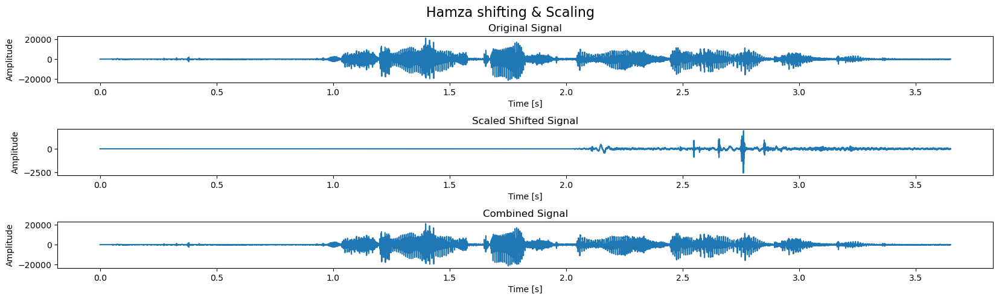

In [873]:
#Let's plot the signals

plt.figure(figsize=(20, 5))
plt.suptitle('Hamza shifting & Scaling', fontsize = 16)
plt.subplots_adjust(hspace = 1)

plt.subplot(3,1,1)
plt.plot(combined_time_hamza, extended_hamza_recording, label = 'Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.title('Original Signal')

plt.subplot(3,1,2)
plt.plot(combined_time_hamza, extended_edited_hamza, label = 'Scaled Shifted Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.title('Scaled Shifted Signal')

plt.subplot(3,1,3)
plt.plot(combined_time_hamza, combined_hamza, label = 'Combined Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.title('Combined Signal')

plt.show()

In [874]:
#Playing The signals
display(Audio(extended_hamza_recording, rate=sample_rate))
display(Audio(edited_hamza, rate=sample_rate))
display(Audio(combined_hamza, rate=sample_rate))

#### 3.3.3 Manipulating Abyad's Signal

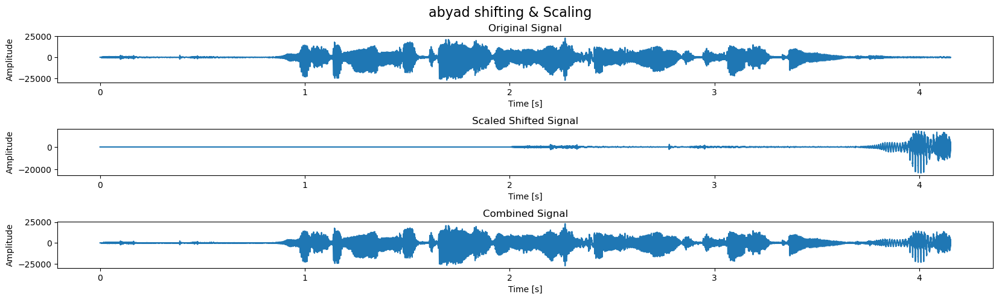

In [875]:
#Let's plot the signals

plt.figure(figsize=(20, 5))
plt.suptitle('abyad shifting & Scaling', fontsize = 16)
plt.subplots_adjust(hspace = 1)

plt.subplot(3,1,1)
plt.plot(combined_time_abyad, extended_abyad_recording, label = 'Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.title('Original Signal')

plt.subplot(3,1,2)
plt.plot(combined_time_abyad, extended_edited_abyad, label = 'Scaled Shifted Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.title('Scaled Shifted Signal')

plt.subplot(3,1,3)
plt.plot(combined_time_abyad, combined_abyad, label = 'Combined Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')
plt.title('Combined Signal')

plt.show()

In [876]:
#Playing The signals
display(Audio(extended_abyad_recording, rate=sample_rate))
display(Audio(edited_abyad, rate=sample_rate))
display(Audio(combined_abyad, rate=sample_rate))

## 4. Fourier Transform & Frequency Shifting

### 4.1 Performing Fourier Transform on the signals
We will use the Fast Fourier Transform (FFT) to convert the signals from the time domain to the frequency domain. This will allow us to analyze the frequency content of the signals.
But first, let's import the required libraries for the fourier transform.

In [877]:
from scipy.fftpack import fft, fftfreq  

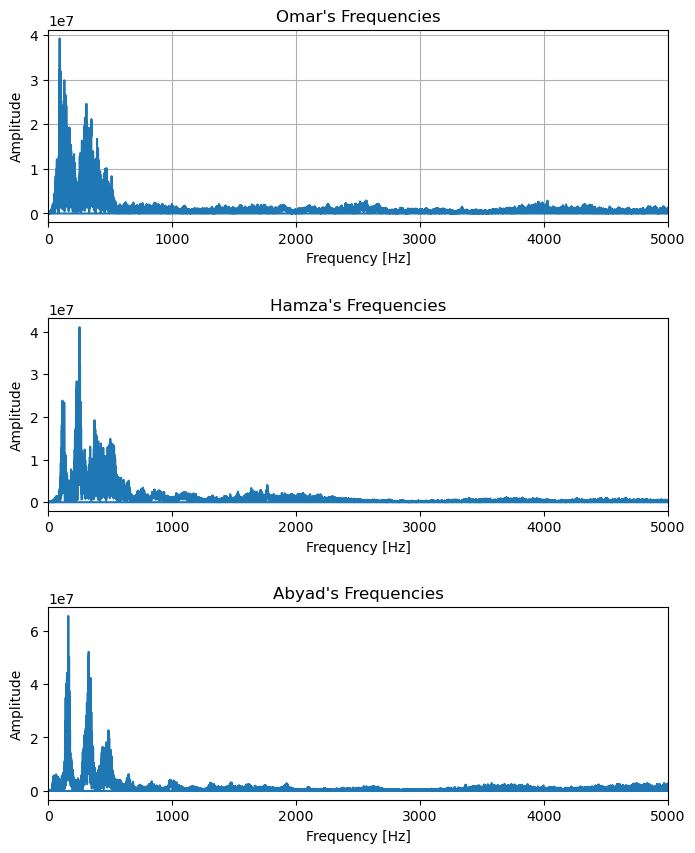

In [878]:
mero_transform = np.fft.fft(mero_recording)
mero_frequencies = np.fft.fftfreq(len(mero_recording), 1/sample_rate)

hamza_transform = np.fft.fft(hamza_recording)
hamza_frequencies = np.fft.fftfreq(len(hamza_recording), 1/sample_rate)

abyad_transform = np.fft.fft(abyad_recording)
abyad_frequencies = np.fft.fftfreq(len(abyad_recording), 1/sample_rate)


plt.figure(figsize=(8, 10))
plt.subplots_adjust(hspace = 0.5)

plt.subplot(3,1,1)
plt.plot(mero_frequencies, np.abs(mero_transform))
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude')
plt.xlim(0, 5000)
plt.title('Omar\'s Frequencies')
plt.grid(visible = True)

plt.subplot(3,1,2)
plt.plot(hamza_frequencies, np.abs(hamza_transform))
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude')
plt.title('Hamza\'s Frequencies')
plt.xlim(0, 5000)

plt.subplot(3,1,3)
plt.plot(abyad_frequencies, np.abs(abyad_transform))
plt.xlabel('Frequency [Hz]')
plt.ylabel('Amplitude')
plt.title('Abyad\'s Frequencies')
plt.xlim(0, 5000)


plt.show()


### 4.2 Shifting the signals in the frequency domain.
We will start by shifting the signals frequencies and perfroming an inverse fourier to see the effect of this shift on the actual sound.

In [879]:
omega_s = -500 # The frequency shift

mero_shifted_frequency_values = mero_frequencies + omega_s # Shift the frequencies values for plotting on the x axis

shifted_mero_transform = np.roll(mero_transform, omega_s) #Shift the amplitudes of the frequencies
mero_sound_shifted_frequency = np.real(np.fft.ifft(shifted_mero_transform)) # Inverse Fourier Transform to get the sound signal with shifted frequencies

hamza_shifted_frequency_values = hamza_frequencies + omega_s # Shift the frequencies values for plotting on the x axis
shifted_hamza_transform = np.roll(hamza_transform, omega_s) #Shift the amplitudes of the frequencies
hamza_sound_shifted_frequency = np.real(np.fft.ifft(shifted_hamza_transform)) # Inverse Fourier Transform to get the sound signal with shifted frequencies

abyad_shifted_frequency_values = abyad_frequencies + omega_s # Shift the frequencies values for plotting on the x axis
shifted_abyad_transform = np.roll(abyad_transform, omega_s) #Shift the amplitudes of the frequencies
abyad_sound_shifted_frequency = np.real(np.fft.ifft(shifted_abyad_transform)) # Inverse Fourier Transform to get the sound signal with shifted frequencies

Let's see what effect this shifting has on the the frequency domain representation of the signals

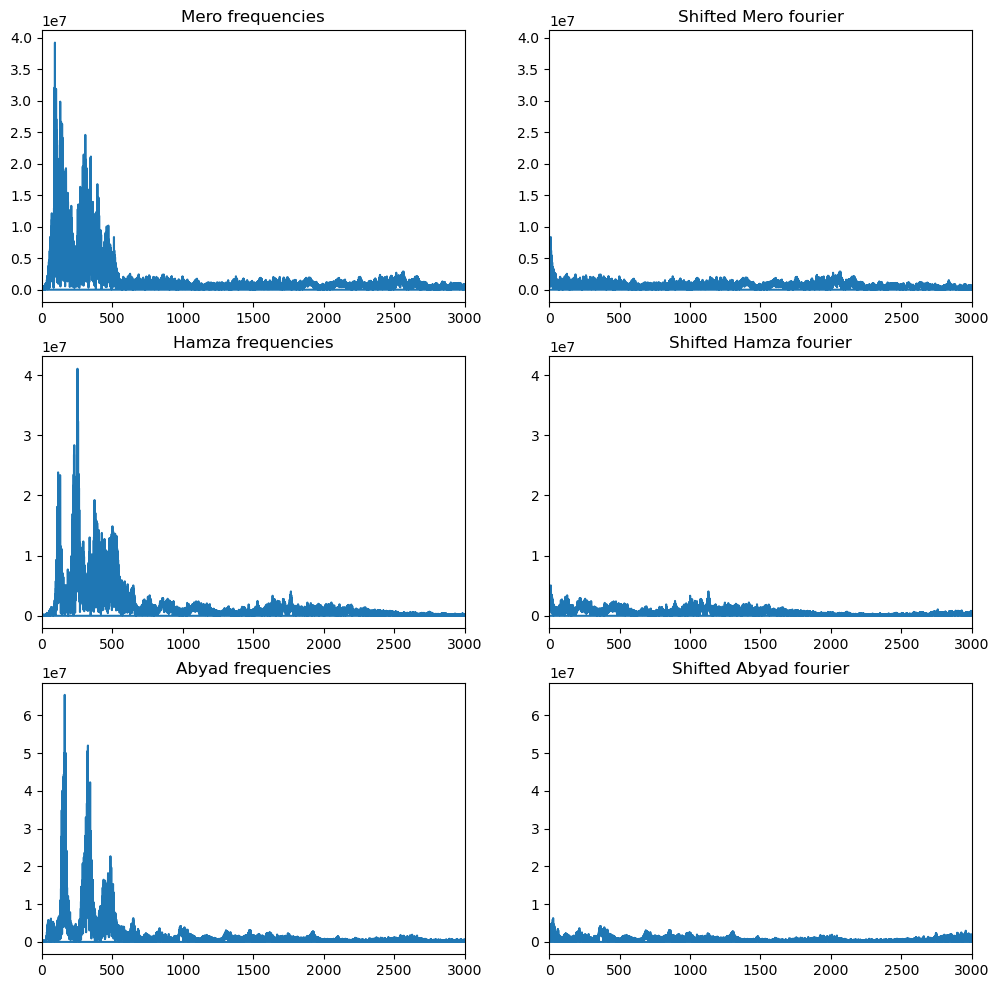

In [880]:
# Plot the Fourier transforms of the signals side by side
fig, axs = plt.subplots(3, 2, figsize=(12, 12))

# Plot Mero signals
axs[0, 0].plot(mero_frequencies, np.abs(mero_transform))
axs[0, 0].set_title('Mero frequencies')
axs[0, 0].set_xlim(0, 3000)
axs[0, 1].plot(mero_shifted_frequency_values, np.abs(mero_transform))
axs[0, 1].set_title('Shifted Mero fourier')
axs[0, 1].set_xlim(0, 3000)

# Plot Hamza signals
axs[1, 0].plot(hamza_frequencies, np.abs(hamza_transform))
axs[1, 0].set_title('Hamza frequencies')
axs[1, 0].set_xlim(0, 3000)
axs[1, 1].plot(hamza_shifted_frequency_values, np.abs(shifted_hamza_transform))
axs[1, 1].set_title('Shifted Hamza fourier')
axs[1, 1].set_xlim(0, 3000)

# Plot Abyad signals
axs[2, 0].plot(abyad_frequencies, np.abs(abyad_transform))
axs[2, 0].set_title('Abyad frequencies')
axs[2, 0].set_xlim(0, 3000)
axs[2, 1].plot(abyad_shifted_frequency_values, np.abs(shifted_abyad_transform))
axs[2, 1].set_title('Shifted Abyad fourier')
axs[2, 1].set_xlim(0, 3000)



# Set the x-axis limits

plt.show()

Now let's inspect what effect this shift has on the sound signals and play them.

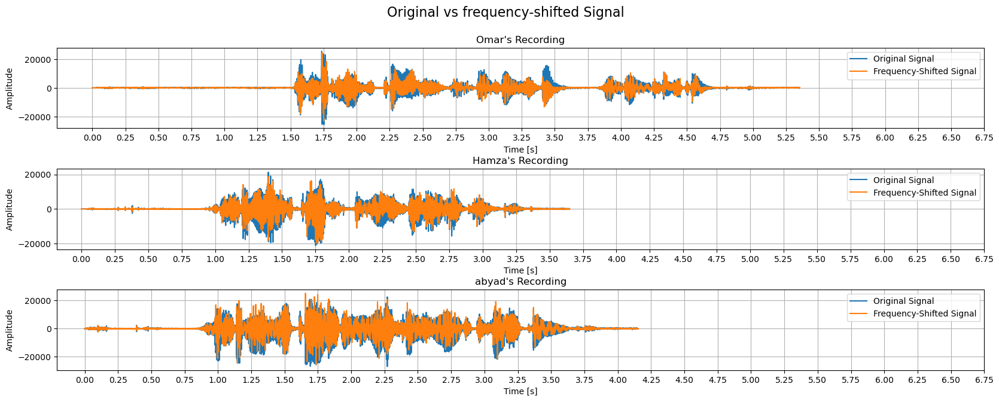

In [881]:

# Plot the result
plt.figure(figsize=(20, 7))
plt.suptitle('Original vs frequency-shifted Signal', fontsize = 16)
plt.subplots_adjust(hspace = 0.5)

#Let's find the maximum time of all signals to unify the x-axis length
max_time = ceil((max(len(mero_recording), len(hamza_recording), len(abyad_recording)) / sample_rate)) +1
tick_spacing = 0.25

plt.subplot(3,1,1)
plt.plot(time_mero, mero_recording, label = 'Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.plot(time_mero, mero_sound_shifted_frequency, label = 'Frequency-Shifted Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.xticks(np.arange(0, max_time, tick_spacing))
plt.grid(visible = True)
plt.title('Omar\'s Recording')
plt.legend(loc = 'upper right')


#Hamza's Signal
plt.subplot(3,1,2)
plt.plot(time_hamza, hamza_recording, label = 'Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.plot(time_hamza, hamza_sound_shifted_frequency, label = 'Frequency-Shifted Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.xticks(np.arange(0, max_time, tick_spacing))
plt.grid(visible = True)
plt.title('Hamza\'s Recording')
plt.legend()

#Abyad's Signal
plt.subplot(3,1,3)
plt.plot(time_abyad, abyad_recording, label = 'Original Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.plot(time_abyad, abyad_sound_shifted_frequency, label = 'Frequency-Shifted Signal')
plt.xlabel('Time [s]')
plt.ylabel('Amplitude')

plt.xticks(np.arange(0, max_time, tick_spacing))
plt.grid(visible = True)
plt.title('abyad\'s Recording')
plt.legend()


plt.show()

Now let's play the signal to see how their sounds differs after changing the frequency.

In [882]:
# Mero original signal
display(Audio(mero_recording, rate=sample_rate))

# Mero signal with shifted frequency
display(Audio(mero_sound_shifted_frequency, rate=sample_rate))

In [883]:
# Hamza original signal
display(Audio(hamza_recording, rate=sample_rate))

# Hamza signal with shifted frequency
display(Audio(hamza_sound_shifted_frequency, rate=sample_rate))

In [884]:
# Abyad original signal
display(Audio(abyad_recording, rate=sample_rate))

# Abyad signal with shifted frequency
display(Audio(abyad_sound_shifted_frequency, rate=sample_rate))

## 5. Low Pass Filter
We will apply a low pass filter to the fourier transform of the signals, and then inspect its effect in the time & frequency domain.

### 5.1 Constructing the function.

In [885]:
def low_pass_filter(signal, cutoff_frequency, sample_rate):
    # Calculate the Fourier transform of the signal
    signal_transform = np.fft.fft(signal)
    
    # Create a frequency domain
    frequencies = np.fft.fftfreq(len(signal_transform), 1/sample_rate)


    
    # Filter the frequencies above the cutoff frequency, using an np mask 
    signal_transform_filtered = np.where(np.abs(frequencies) < cutoff_frequency, signal_transform, 0)
    

    
    # Inverse Fourier transform to get the filtered signal
    signal_filtered = np.real(np.fft.ifft(signal_transform_filtered))
    
    return signal_filtered

### 5.2 Cutting off our signals

In [886]:
cutoff_frequency = 300 # The cutoff frequency in Hz

#Applying our constructed low pass filter to the signals
mero_signal_low_filtered = low_pass_filter(mero_recording, cutoff_frequency, sample_rate)

hamza_signal_low_filtered = low_pass_filter(hamza_recording, cutoff_frequency, sample_rate)

abyad_signal_low_filtered = low_pass_filter(abyad_recording, cutoff_frequency, sample_rate)

### 5.3 Plotting
Now let's plot our signals transforms before and after the filter

#### 5.3.1 Plotting in the frequency domain


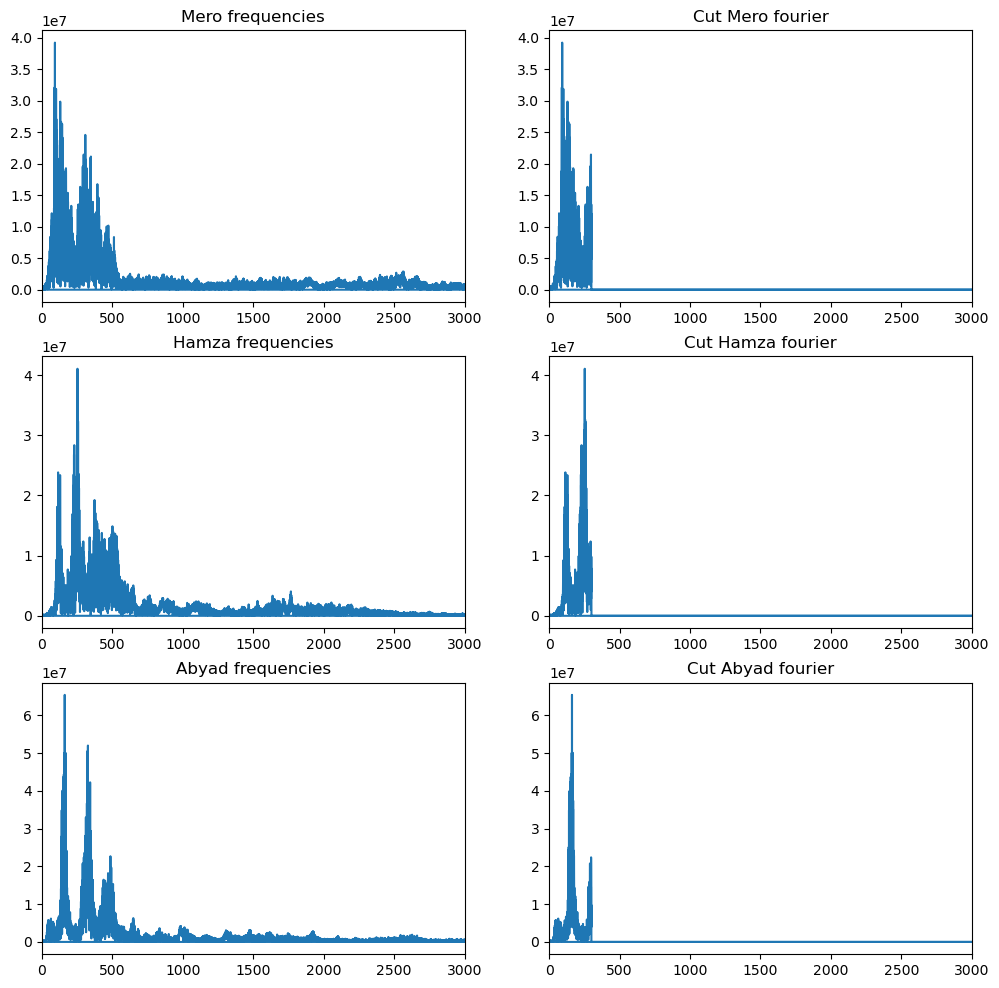

In [887]:
# Plot the Fourier transforms of the signals side by side
fig, axs = plt.subplots(3, 2, figsize=(12, 12))

# Plot Mero signals
axs[0, 0].plot(mero_frequencies, np.abs(mero_transform))
axs[0, 0].set_title('Mero frequencies')
axs[0, 0].set_xlim(0, 3000)
axs[0, 1].plot(fftfreq(len(mero_signal_low_filtered),1/sample_rate), np.abs(fft(mero_signal_low_filtered)))
axs[0, 1].set_title('Cut Mero fourier')
axs[0, 1].set_xlim(0, 3000)

# Plot Hamza signals
axs[1, 0].plot(hamza_frequencies, np.abs(hamza_transform))
axs[1, 0].set_title('Hamza frequencies')
axs[1, 0].set_xlim(0, 3000)
axs[1, 1].plot(fftfreq(len(hamza_signal_low_filtered),1/sample_rate), np.abs(fft(hamza_signal_low_filtered)))
axs[1, 1].set_title('Cut Hamza fourier')
axs[1, 1].set_xlim(0, 3000)

# Plot Abyad signals
axs[2, 0].plot(abyad_frequencies, np.abs(abyad_transform))
axs[2, 0].set_title('Abyad frequencies')
axs[2, 0].set_xlim(0, 3000)
axs[2, 1].plot(fftfreq(len(abyad_signal_low_filtered),1/sample_rate), np.abs(fft(abyad_signal_low_filtered)))
axs[2, 1].set_title('Cut Abyad fourier')
axs[2, 1].set_xlim(0, 3000)



plt.show()

#### 5.3.2 Time signal
And now let's plot the time signals

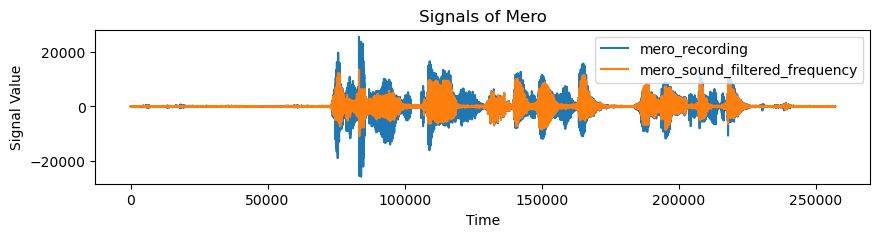

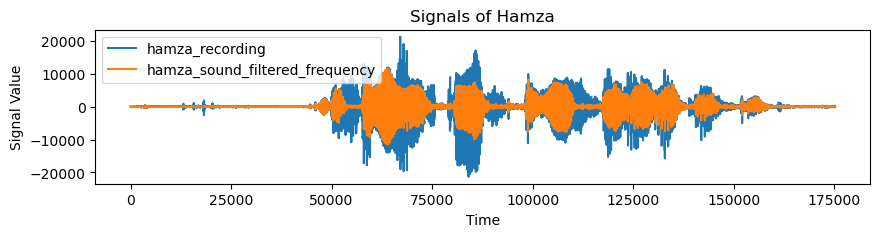

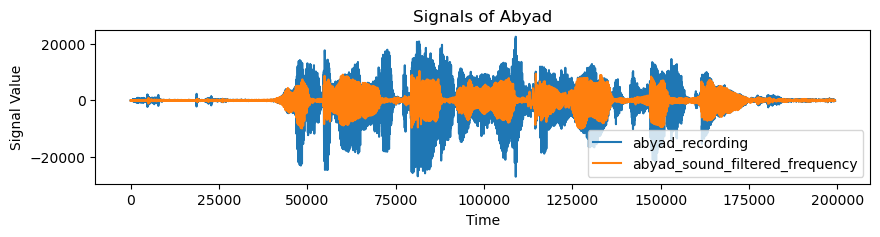

In [888]:
# Plotting signals for  'mero'
plt.figure(figsize=(10, 2))
plt.plot(mero_recording, label='mero_recording')
plt.plot(mero_signal_low_filtered, label='mero_sound_filtered_frequency')
plt.legend()
plt.title("Signals of Mero")
plt.xlabel("Time")
plt.ylabel("Signal Value")

# Plotting signals for  'hamza'
plt.figure(figsize=(10, 2))
plt.plot(hamza_recording, label='hamza_recording')
plt.plot(hamza_signal_low_filtered, label='hamza_sound_filtered_frequency')
plt.legend()
plt.title("Signals of Hamza")
plt.xlabel("Time")
plt.ylabel("Signal Value")


# Plotting signals for  'abyad'
plt.figure(figsize=(10, 2))
plt.plot(abyad_recording, label='abyad_recording')
plt.plot(abyad_signal_low_filtered, label='abyad_sound_filtered_frequency')
plt.legend()
plt.title("Signals of Abyad")
plt.xlabel("Time")
plt.ylabel("Signal Value")


plt.show()

### 5.4 Playing the filtered vs Originals

In [889]:
#Playing Omar's Recordings
display(Audio(mero_recording, rate=sample_rate))
display(Audio(mero_signal_low_filtered, rate=sample_rate))

In [890]:
#Playing Hamza's Recordings
display(Audio(hamza_recording, rate=sample_rate))
display(Audio(hamza_signal_low_filtered, rate=sample_rate))

In [891]:
#Playing Abyad's Recordings
display(Audio(abyad_recording, rate=sample_rate))
display(Audio(abyad_signal_low_filtered, rate=sample_rate))

## 6. High Pass Filter
We will apply a high pass filter to the fourier transform of the signals, and then inspect its effect in the time & frequency domain.

### 6.1 Constructing the Function.

In [892]:
def high_pass_filter(signal, cutoff_frequency, sample_rate):
    # Calculate the Fourier transform of the signal
    signal_transform = np.fft.fft(signal)
    
    # Create a frequency domain
    frequencies = np.fft.fftfreq(len(signal_transform), 1/sample_rate)


    
    # Filter the frequencies above the cutoff frequency, using an np mask 
    signal_transform_filtered = np.where(np.abs(frequencies) > cutoff_frequency, signal_transform, 0)
    

    
    # Inverse Fourier transform to get the filtered signal
    signal_filtered = np.real(np.fft.ifft(signal_transform_filtered))
    
    return signal_filtered

### 6.2 Cutting off our signals

In [893]:
cutoff_frequency = 300 # The cutoff frequency in Hz

#Applying our constructed low pass filter to the signals
mero_signal_high_filtered = high_pass_filter(mero_recording, cutoff_frequency, sample_rate)

hamza_signal_high_filtered = high_pass_filter(hamza_recording, cutoff_frequency, sample_rate)

abyad_signal_high_filtered = high_pass_filter(abyad_recording, cutoff_frequency, sample_rate)

### 6.3 Plotting
Now let's plot our signals transforms before and after the filter

#### 6.3.1 Plotting in the frequency domain


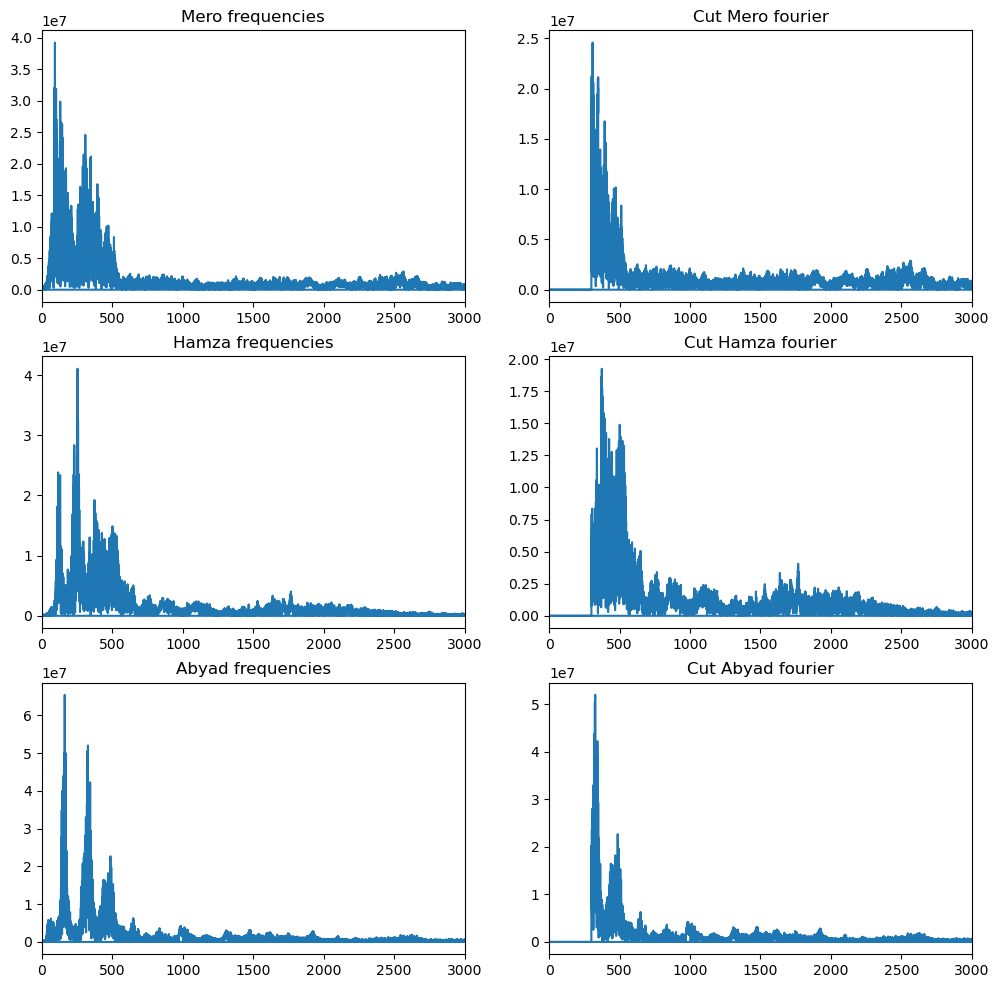

In [894]:
# Plot the Fourier transforms of the signals side by side
fig, axs = plt.subplots(3, 2, figsize=(12, 12))

# Plot Mero signals
axs[0, 0].plot(mero_frequencies, np.abs(mero_transform))
axs[0, 0].set_title('Mero frequencies')
axs[0, 0].set_xlim(0, 3000)
axs[0, 1].plot(fftfreq(len(mero_signal_high_filtered),1/sample_rate), np.abs(fft(mero_signal_high_filtered)))
axs[0, 1].set_title('Cut Mero fourier')
axs[0, 1].set_xlim(0, 3000)

# Plot Hamza signals
axs[1, 0].plot(hamza_frequencies, np.abs(hamza_transform))
axs[1, 0].set_title('Hamza frequencies')
axs[1, 0].set_xlim(0, 3000)
axs[1, 1].plot(fftfreq(len(hamza_signal_high_filtered),1/sample_rate), np.abs(fft(hamza_signal_high_filtered)))
axs[1, 1].set_title('Cut Hamza fourier')
axs[1, 1].set_xlim(0, 3000)

# Plot Abyad signals
axs[2, 0].plot(abyad_frequencies, np.abs(abyad_transform))
axs[2, 0].set_title('Abyad frequencies')
axs[2, 0].set_xlim(0, 3000)
axs[2, 1].plot(fftfreq(len(abyad_signal_high_filtered),1/sample_rate), np.abs(fft(abyad_signal_high_filtered)))
axs[2, 1].set_title('Cut Abyad fourier')
axs[2, 1].set_xlim(0, 3000)



plt.show()

#### 6.3.2 Time signal
And now let's plot the time signals

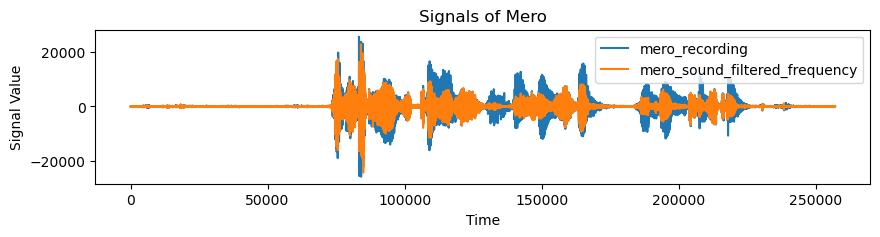

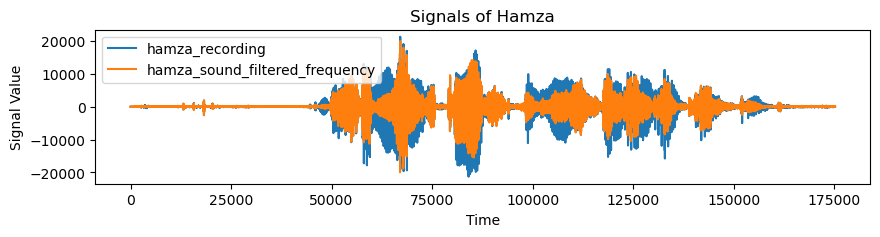

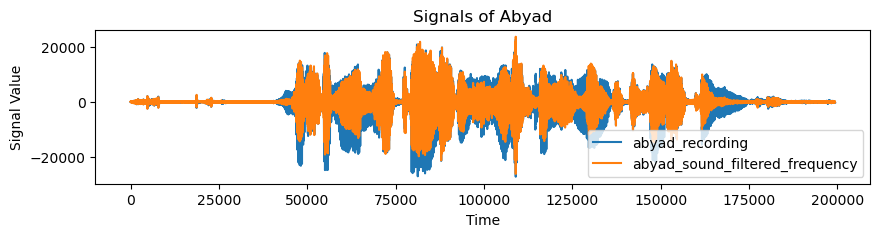

In [895]:
# Plotting signals for  'mero'
plt.figure(figsize=(10, 2))
plt.plot(mero_recording, label='mero_recording')
plt.plot(mero_signal_high_filtered, label='mero_sound_filtered_frequency')
plt.legend()
plt.title("Signals of Mero")
plt.xlabel("Time")
plt.ylabel("Signal Value")

# Plotting signals for  'hamza'
plt.figure(figsize=(10, 2))
plt.plot(hamza_recording, label='hamza_recording')
plt.plot(hamza_signal_high_filtered, label='hamza_sound_filtered_frequency')
plt.legend()
plt.title("Signals of Hamza")
plt.xlabel("Time")
plt.ylabel("Signal Value")


# Plotting signals for  'abyad'
plt.figure(figsize=(10, 2))
plt.plot(abyad_recording, label='abyad_recording')
plt.plot(abyad_signal_high_filtered, label='abyad_sound_filtered_frequency')
plt.legend()
plt.title("Signals of Abyad")
plt.xlabel("Time")
plt.ylabel("Signal Value")


plt.show()

### 6.4 Playing the filtered vs Originals

In [896]:
#Playing Omar's Recordings
display(Audio(mero_recording, rate=sample_rate))
display(Audio(mero_signal_high_filtered, rate=sample_rate))

In [897]:
#Playing Hamza's Recordings
display(Audio(hamza_recording, rate=sample_rate))
display(Audio(hamza_signal_high_filtered, rate=sample_rate))

In [898]:
#Playing Abyad's Recordings
display(Audio(abyad_recording, rate=sample_rate))
display(Audio(abyad_signal_high_filtered, rate=sample_rate))

## 7. Applying a custom function
For our final process, we will filter our signals with a custom 'filter' in the frequency domain, represented by the following picture.

<img src="Images/custom-filter.png" style="width:600px;">

### 7.1 Drawing the function
To draw the filter we will use the piecewise method.

In [907]:
cutoff_freq = 700 # The cutoff frequency omega_c in Hz

#We will draw different rectangular functions for each signa to fit the x-axis scale of each one

mero_triangular_filter = np.piecewise(mero_frequencies, [np.abs(mero_frequencies) < cutoff_freq/2, 
                                (np.abs(mero_frequencies) >= cutoff_freq/2) & (np.abs(mero_frequencies) <= cutoff_freq)],
                                 [lambda x: 2*x/cutoff_freq, lambda x: 2*(cutoff_freq-x)/cutoff_freq, 0])

hamza_triangular_filter = np.piecewise(hamza_frequencies, [np.abs(hamza_frequencies) < cutoff_freq/2,
                                (np.abs(hamza_frequencies) >= cutoff_freq/2) & (np.abs(hamza_frequencies) <= cutoff_freq)],
                                 [lambda x: 2*x/cutoff_freq, lambda x: 2*(cutoff_freq-x)/cutoff_freq, 0])

abyad_triangular_filter = np.piecewise(abyad_frequencies, [np.abs(abyad_frequencies) < cutoff_freq/2,
                                (np.abs(abyad_frequencies) >= cutoff_freq/2) & (np.abs(abyad_frequencies) <= cutoff_freq)],
                                 [lambda x: 2*x/cutoff_freq, lambda x: 2*(cutoff_freq-x)/cutoff_freq, 0])

### 7.2 Applying the Custom Filter
We will apply the filter by multiplying it by the frequency representation of each function and then get the signal by using an inverse fourier.

In [908]:
mero_signal_triangle_filtered_transform = mero_transform * mero_triangular_filter
mero_signal_triangle_filtered = np.real(np.fft.ifft(mero_signal_triangle_filtered_transform))

hamza_signal_triangle_filtered_transform = hamza_transform * hamza_triangular_filter
hamza_signal_triangle_filtered = np.real(np.fft.ifft(hamza_signal_triangle_filtered_transform))

abyad_signal_triangle_filtered_transform = abyad_transform * abyad_triangular_filter
abyad_signal_triangle_filtered = np.real(np.fft.ifft(abyad_signal_triangle_filtered_transform))

### 7.3 Plotting the filtered Signals

#### 7.3.1 Plotting in the frequency domain


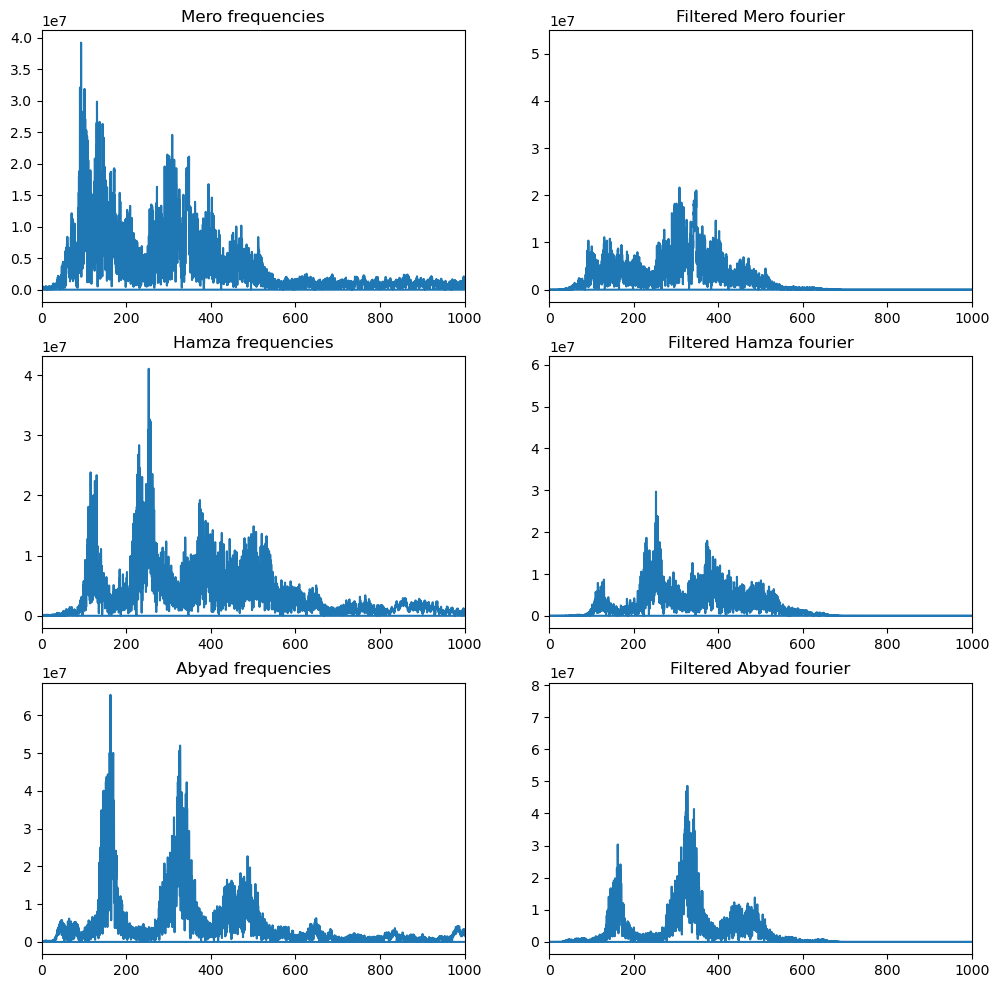

In [914]:
# Plot the Fourier transforms of the signals side by side
fig, axs = plt.subplots(3, 2, figsize=(12, 12))

# Plot Mero signals
axs[0, 0].plot(mero_frequencies, np.abs(mero_transform))
axs[0, 0].set_title('Mero frequencies')
axs[0, 0].set_xlim(0, 1000)
axs[0, 1].plot(mero_frequencies, np.abs(mero_signal_triangle_filtered_transform))
axs[0, 1].set_title('Filtered Mero fourier')
axs[0, 1].set_xlim(0, 1000)

# Plot Hamza signals
axs[1, 0].plot(hamza_frequencies, np.abs(hamza_transform))
axs[1, 0].set_title('Hamza frequencies')
axs[1, 0].set_xlim(0, 1000)
axs[1, 1].plot(hamza_frequencies, np.abs(hamza_signal_triangle_filtered_transform))
axs[1, 1].set_title('Filtered Hamza fourier')
axs[1, 1].set_xlim(0, 1000)

# Plot Abyad signals
axs[2, 0].plot(abyad_frequencies, np.abs(abyad_transform))
axs[2, 0].set_title('Abyad frequencies')
axs[2, 0].set_xlim(0, 1000)
axs[2, 1].plot(abyad_frequencies, np.abs(abyad_signal_triangle_filtered_transform))
axs[2, 1].set_title('Filtered Abyad fourier')
axs[2, 1].set_xlim(0, 1000)



plt.show()

#### 7.3.2 Time signal
And now let's plot the time signals

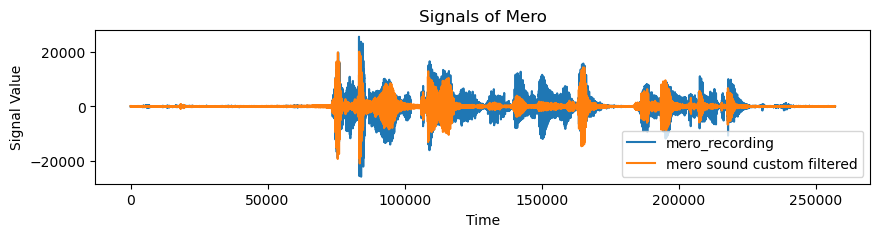

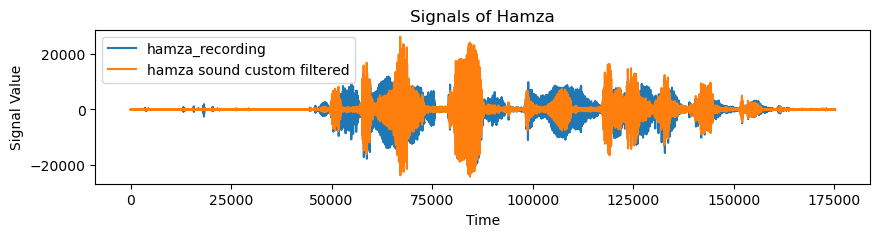

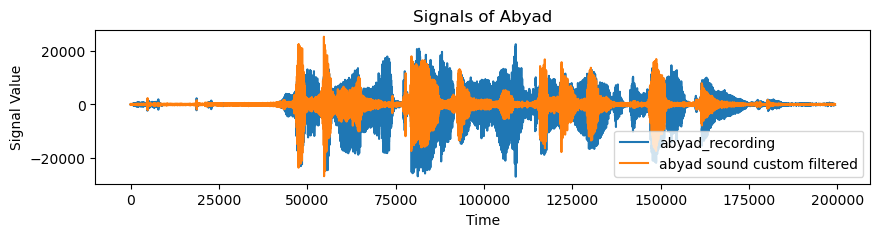

In [910]:
# Plotting signals for  'mero'
plt.figure(figsize=(10, 2))
plt.plot(mero_recording, label='mero_recording')
plt.plot(mero_signal_triangle_filtered, label='mero sound custom filtered')
plt.legend()
plt.title("Signals of Mero")
plt.xlabel("Time")
plt.ylabel("Signal Value")

# Plotting signals for  'hamza'
plt.figure(figsize=(10, 2))
plt.plot(hamza_recording, label='hamza_recording')
plt.plot(hamza_signal_triangle_filtered, label='hamza sound custom filtered')
plt.legend()
plt.title("Signals of Hamza")
plt.xlabel("Time")
plt.ylabel("Signal Value")

# Plotting signals for  'abyad'
plt.figure(figsize=(10, 2))
plt.plot(abyad_recording, label='abyad_recording')
plt.plot(abyad_signal_triangle_filtered, label='abyad sound custom filtered')
plt.legend()
plt.title("Signals of Abyad")
plt.xlabel("Time")
plt.ylabel("Signal Value")


plt.show()

### 7.4 Playing the filtered vs Originals
Now let's compare what difference in sound this filter makes.

In [911]:
#Playing Omar's Recordings
display(Audio(mero_recording, rate=sample_rate))
display(Audio(mero_signal_triangle_filtered, rate=sample_rate))

In [912]:
#Playing Hamza's Recordings
display(Audio(hamza_recording, rate=sample_rate))
display(Audio(hamza_signal_triangle_filtered, rate=sample_rate))

In [913]:
#Playing Abyad's Recordings
display(Audio(abyad_recording, rate=sample_rate))
display(Audio(abyad_signal_triangle_filtered, rate=sample_rate))

## Credits and Names
T10 - Omar Emadeldeen, 13001568

T10 - Abdelrahman Al Abyad, 

T - Hamza,